In [13]:
# Чтобы меньше возиться в выводом изображений от matplotlib, сделаем формат вывода inline
# Изображения буду выводиться в столбец, друг за другом.
%matplotlib inline

### Создадим функции для обработки датасетов и преобразования их в YOLO-датасет

In [6]:
import os
import xml.etree.ElementTree as ET
from tqdm import tqdm

# Функция для преобразования координат BB из XML в txt (акутально для LogoDet-3K)
def convert_annotation(xml_file, output_txt_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    with open(output_txt_file, 'w') as f:
        for obj in root.findall('object'):
            class_id = 0

            bbox = obj.find('bndbox')
            xmin = int(bbox.find('xmin').text)
            ymin = int(bbox.find('ymin').text)
            xmax = int(bbox.find('xmax').text)
            ymax = int(bbox.find('ymax').text)

            image_width = int(root.find('size/width').text)
            image_height = int(root.find('size/height').text)

            x_center = (xmin + xmax) / 2 / image_width
            y_center = (ymin + ymax) / 2 / image_height
            width = (xmax - xmin) / image_width
            height = (ymax - ymin) / image_height

            f.write(f"{class_id} {x_center} {y_center} {width} {height}\n")


def convert_dataset(dataset_path, output_path):
    for category in os.listdir(dataset_path):
        category_path = os.path.join(dataset_path, category)
        output_category_path = os.path.join(output_path, category)  # Соответствующая папка в output_path
        os.makedirs(output_category_path, exist_ok=True)  # Создаем папку категории

        for company in os.listdir(category_path):
            company_path = os.path.join(category_path, company)
            output_company_path = os.path.join(output_category_path, company)  # Соответствующая папка компании
            os.makedirs(output_company_path, exist_ok=True)  # Создаем папку компании

            for file in os.listdir(company_path):
                if file.endswith('.xml'):
                    xml_file = os.path.join(company_path, file)
                    image_file = os.path.join(company_path, file.replace('.xml', '.jpg'))
                    txt_file = os.path.join(output_company_path, file.replace('.xml', '.txt'))  # Сохраняем в соответствующую папку

                    if os.path.exists(image_file):
                        convert_annotation(xml_file, txt_file)

dataset_path = 'LogoDet-3K'
output_path = 'LogoDet-3K'  # Директория для записи файлов с сохранением структуры

# Создаем выходную директорию, если она не существует
os.makedirs(output_path, exist_ok=True)

# Конвертируем датасет
convert_dataset(dataset_path, output_path)

In [5]:
import os
import shutil
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# Функция для преобразования датасета, где изображения и разметка (в txt) находятся в одной папке,
# в датасет YOLO-формата
def create_yolo_structure(dataset_path, output_path, test_size=0.2):
    os.makedirs(os.path.join(output_path, 'images', 'train'), exist_ok=True)
    os.makedirs(os.path.join(output_path, 'images', 'val'), exist_ok=True)
    os.makedirs(os.path.join(output_path, 'labels', 'train'), exist_ok=True)
    os.makedirs(os.path.join(output_path, 'labels', 'val'), exist_ok=True)

    # Собираем все изображения и аннотации
    images = []
    labels = []
    for root, dirs, files in os.walk(dataset_path):
        for file in files:
            if file.endswith('.jpg'):
                images.append(os.path.join(root, file))
                labels.append(os.path.join(root, file.replace('.jpg', '.txt')))

    # Разделяем на train и val
    train_images, val_images, train_labels, val_labels = train_test_split(
        images, labels, test_size=test_size, random_state=42
    )

    # Копируем файлы в папку итогового датасета
    for idx, (img, lbl) in enumerate(tqdm(zip(train_images, train_labels))):
        shutil.copy(img, os.path.join(output_path, 'images', 'train', os.path.basename(f'{idx}.jpg')))
        shutil.copy(lbl, os.path.join(output_path, 'labels', 'train', os.path.basename(f'{idx}.txt')))

    for idx, (img, lbl) in enumerate(tqdm(zip(val_images, val_labels))):
        shutil.copy(img, os.path.join(output_path, 'images', 'val', os.path.basename(f'{idx}.jpg')))
        shutil.copy(lbl, os.path.join(output_path, 'labels', 'val', os.path.basename(f'{idx}.txt')))


### Обучим базовую модель YOLO11, для детекции логотипов (без привязки к компании)

In [ ]:
dataset_path = 'LogoDet-3K'
output_path = 'yolo_dataset'

create_yolo_structure(dataset_path, output_path)

In [3]:
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator

model = YOLO("yolo11n.pt")

In [ ]:
results = model.train(data='dataset_config.yaml', epochs=1, batch=32)
print(results)

Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3070, 8191MiB)
engine\trainer: task=detect, mode=train, model=M:\VK_ML_tech_task\runs\detect\train23\weights\best.pt, data=dataset_config.yaml, epochs=1, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train24, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

train: Scanning M:\VK_ML_tech_task\yolo_dataset\labels\train.cache... 126923 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126923/126923 [00:00<?, ?it/s]
val: Scanning M:\VK_ML_tech_task\yolo_dataset\labels\val.cache... 31731 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31731/31731 [00:00<?, ?it/s]

val: WARNING  M:\VK_ML_tech_task\yolo_dataset\images\val\3885.jpg: 1 duplicate labels removed


Plotting labels to runs\detect\train24\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train24
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1      4.99G      1.207      1.245      1.336         27        640: 100%|██████████| 3967/3967 [24:46<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 496/496 [06:08<00:00,  1.35it/s]


                   all      31731      38749      0.646      0.645      0.669      0.393

1 epochs completed in 0.519 hours.
Optimizer stripped from runs\detect\train24\weights\last.pt, 5.4MB
Optimizer stripped from runs\detect\train24\weights\best.pt, 5.4MB

Validating runs\detect\train24\weights\best.pt...
Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3070, 8191MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 496/496 [05:30<00:00,  1.50it/s]


                   all      31731      38749      0.646      0.646      0.669      0.394
Speed: 0.1ms preprocess, 1.5ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs\detect\train24
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000028B1DF849B0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    

In [3]:
exported_model = model.export()
print(exported_model)

Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CPU (Intel Xeon E5-2689 0 2.60GHz)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from 'runs\detect\train24\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (5.2 MB)

TorchScript: starting export with torch 2.6.0+cu126...
TorchScript: export success  4.1s, saved as 'runs\detect\train24\weights\best.torchscript' (10.4 MB)

Export complete (4.8s)
Results saved to M:\VK_ML_tech_task\runs\detect\train24\weights
Predict:         yolo predict task=detect model=runs\detect\train24\weights\best.torchscript imgsz=640  
Validate:        yolo val task=detect model=runs\detect\train24\weights\best.torchscript imgsz=640 data=dataset_config.yaml  
Visualize:       https://netron.app
runs\detect\train24\weights\best.torchscript


### Посмотрим, что модель научилась видеть

In [10]:
def plot_bboxes(r):
    annotator = Annotator(r.orig_img)
    boxes = r.boxes
    for box in boxes:
        b = box.xyxy[0]
        c = box.cls
        annotator.box_label(b, model.names[int(c)])
    img = annotator.result() 
    return img


0: 640x640 1 logo, 9.1ms
1: 640x640 1 logo, 9.1ms
2: 640x640 1 logo, 9.1ms
3: 640x640 (no detections), 9.1ms
4: 640x640 2 logos, 9.1ms
5: 640x640 (no detections), 9.1ms
6: 640x640 2 logos, 9.1ms
7: 640x640 2 logos, 9.1ms
8: 640x640 2 logos, 9.1ms
9: 640x640 3 logos, 9.1ms
10: 640x640 1 logo, 9.1ms
11: 640x640 3 logos, 9.1ms
12: 640x640 2 logos, 9.1ms
13: 640x640 3 logos, 9.1ms
14: 640x640 2 logos, 9.1ms
Speed: 3.8ms preprocess, 9.1ms inference, 9.3ms postprocess per image at shape (1, 3, 640, 640)
15


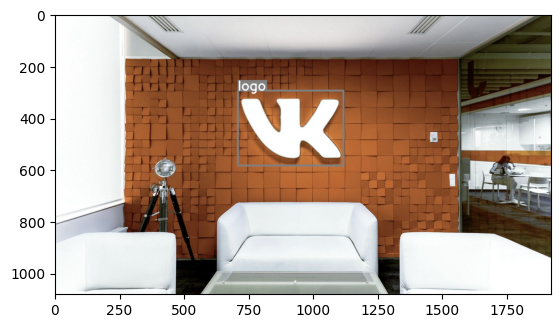

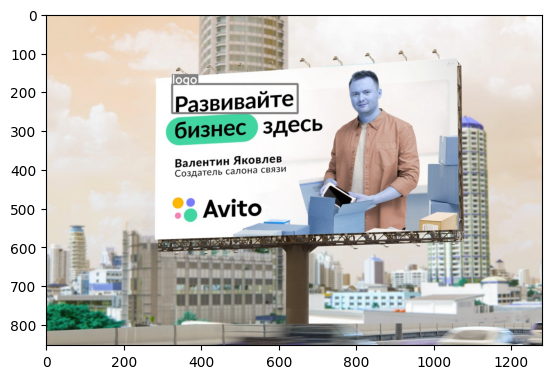

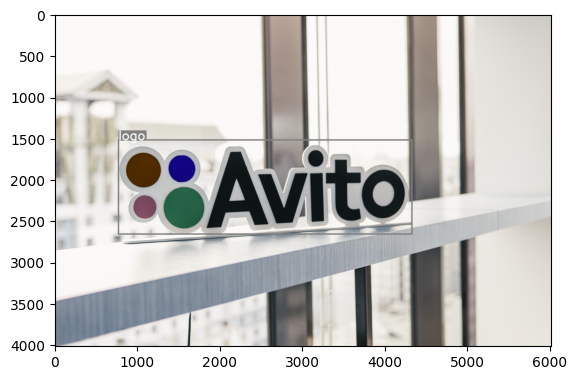

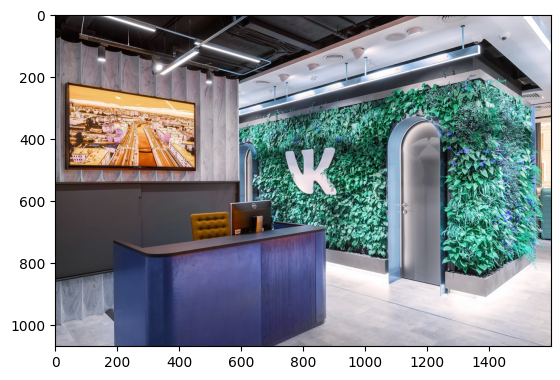

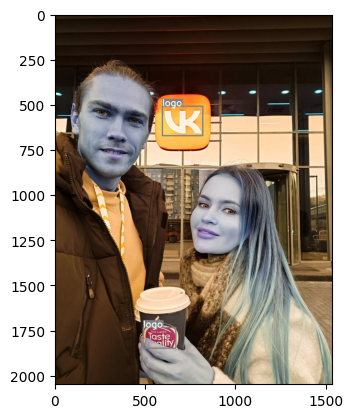

...

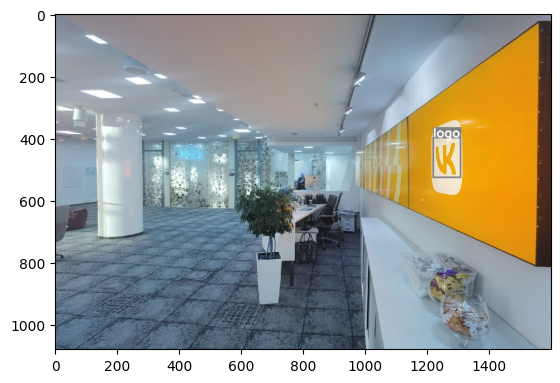

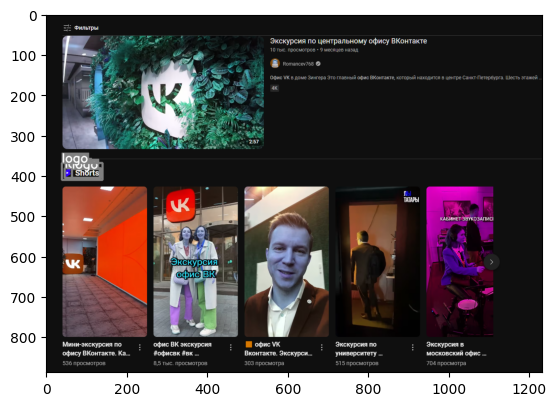

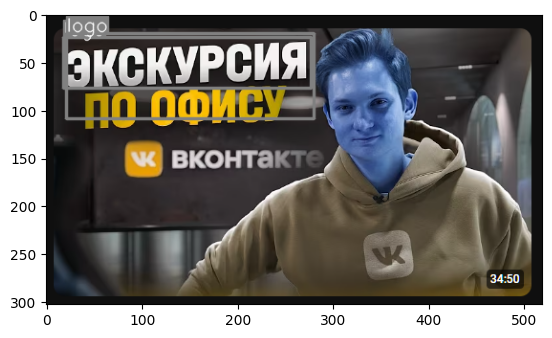

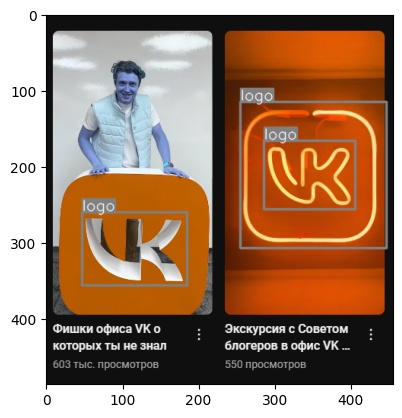

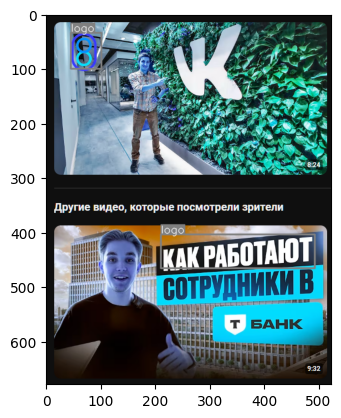

In [4]:
import matplotlib.pyplot as plt

#results = model([fr'M:/VK_ML_tech_task/yolo_dataset/images/val/{idx}.jpg' for idx in range(10, 25)])
results = model([f'my_test_images/{x}' for x in os.listdir('my_test_images')])
print(len(results))
for r in results:
    img = plot_bboxes(r)
    plt.imshow(img)
    plt.show()

Часть логотипов модель увидела, часть нет. В целом, для быстрого обучения на не самом лучшем датасете - не так уж и плохо

## **1 Способ (эмбеддинги)**
### Попробуем сохранять кропы, после чего сравнивать их эмбеддинги с эмбеддингами исходных логотипов компаний.

In [6]:
from PIL import Image
import numpy as np
import cv2
#image = np.asarray(Image.open('my_test_images/vk_yt3.PNG'))
image_bgr = cv2.imread('my_test_images/vk_yt3.PNG')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

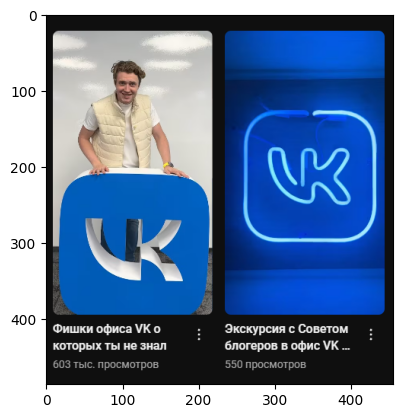

In [72]:
plt.imshow(image_rgb)

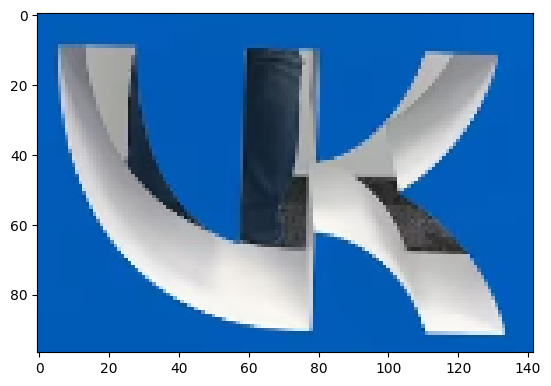

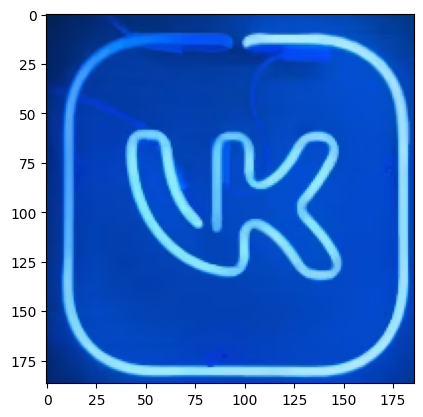

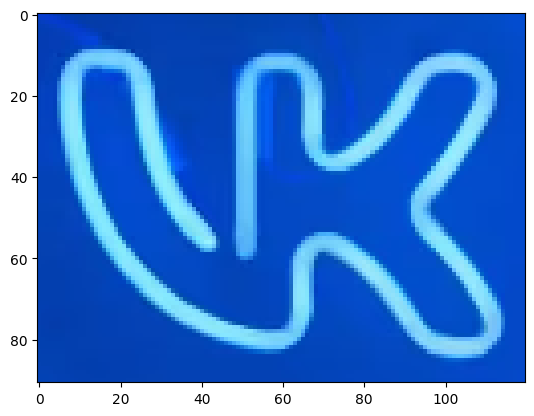

In [92]:
preds = model('my_test_images/vk_yt3.PNG')

for pred in preds:
    for idx, box in enumerate(pred.boxes):
        x1, y1, x2, y2 = box.xyxy[0].cpu().int()
        crop = image_rgb[y1:y2, x1:x2]
        plt.imsave(f'crops/vk_crop_{idx}.png', crop)
        plt.imshow(crop)
        plt.show()

In [118]:
import torch
import torchvision.transforms as transforms
from torchvision import models

# Возьмем предобученную модель ResNet
resnet_model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
resnet_model.eval()

# Предобработаем изображение
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def extract_features(image_path):
    image = Image.open(image_path).convert('RGB')
    plt.imshow(image)
    plt.show()
    image = preprocess(image)
    image = image.unsqueeze(0)  # Имитирую batch 

    with torch.no_grad():
        features = resnet_model(image)
    return features.squeeze().numpy()


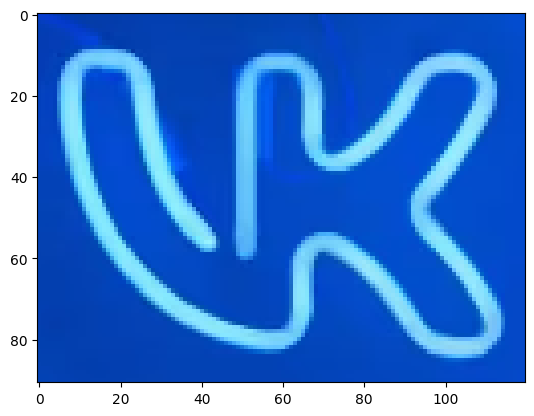

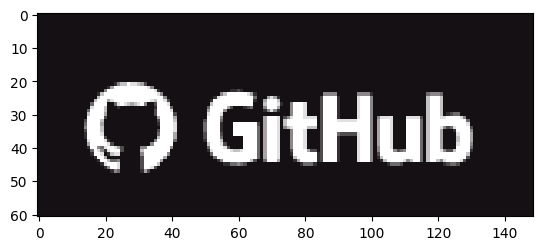

Косинусное расстояние: 0.46873076426218674


In [125]:
import numpy as np
from scipy.spatial.distance import cosine

def compare_embeddings(embedding1, embedding2):
    return cosine(embedding1, embedding2)

# Пример использования
#embedding1 = extract_features('crops/vk_crop_1.png')
embedding1 = extract_features('crops/vk_crop_2.png')
embedding2 = extract_features('base_logos/github_logo.png')
similarity = compare_embeddings(embedding1, embedding2)
print(f'Косинусное расстояние: {similarity}')


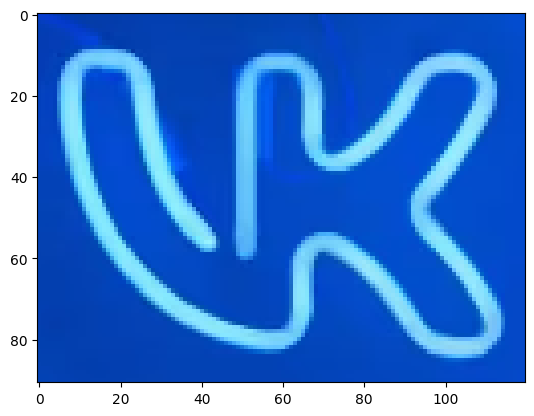

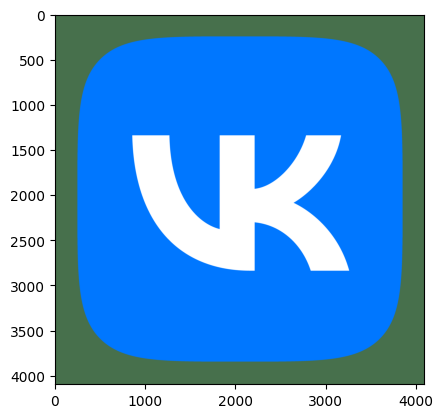

Косинусное расстояние: 0.5058303578441097


In [124]:
embedding1 = extract_features('crops/vk_crop_2.png')
embedding2 = extract_features('base_logos/vk_1.png')
similarity = compare_embeddings(embedding1, embedding2)
print(f'Косинусное расстояние: {similarity}')

Получилось так себе. Лого гитхаба оказалось больше похоже на логотип ВК, чем настоящий логотип ВК.

## **2 Способ (дообучение YOLO)**
### Нагенерируем изображений с логотипами компаний, которые мы будет искать. Затем, дообучим модель на сгенерированных данных

В качестве фонов я использовал изображения из датасета COCO: https://universe.roboflow.com/yolov8-6mvq3/coco-small-bzl29/dataset/2 (без разметки)

### Создадим искусственные данные с логотипами организаций (примеры см. в конце ноутбука)

In [4]:
import os
import numpy as np
from tqdm import tqdm
from PIL import Image
import imgaug.augmenters as iaa

# Пример аугментации
augmenter = iaa.Sequential([
    iaa.Fliplr(0.3),  # Горизонтальное отражение
    iaa.Crop(percent=(0, 0.05)),  # Обрезание
    iaa.Affine(translate_percent={"x": (-0.05, 0.05), "y": (-0.05, 0.05)}),  # Сдвиг
    iaa.Affine(rotate=(-15, 15)),  # Поворот
    iaa.Affine(scale=(0.8, 1.1)),  # Масштабирование
    iaa.AddToHue((-30, 30)),  # Изменение оттенка
    iaa.AddToSaturation((-30, 30)),  # Изменение насыщенности
    iaa.AddToBrightness((-30, 30)),  # Изменение яркости
    iaa.GaussianBlur(sigma=0.25), # Сделаем чуток гауссовского шума
    iaa.MotionBlur(angle=0, k=4), # Слегка сделаем моушн блюр, т.к. сказано, что изображения будут браться из видео
    iaa.PerspectiveTransform(scale=(0.02, 0.125)), # Изменим перспективу, т.к. на видео лого могут быть под углом
    iaa.ChangeColorTemperature(kelvin=(2000, 8000)), # Цветовую гамму тоже поменям, т.к. дизайн лого по цветам может меняться
])


def generate_additional_data(logos_path, backgrounds_path, company_name, classes_in_model: int, output_folder):
    os.makedirs(f'{output_folder}/{company_name}', exist_ok=True)  # Создаем папку категории

    for logo_idx, logo_name in enumerate(os.listdir(logos_path)):
        # Загрузка логотипа с прозрачностью
        logo = Image.open(f'{logos_path}/{logo_name}').convert("RGBA")

        min_size = 50
        max_size = 350

        for idx, i in enumerate(tqdm(np.random.permutation(len(os.listdir(backgrounds_path)))[:1000])):
            # Масштабирование логотипа
            scale_factor = np.random.uniform(min_size / max(logo.size), max_size / max(logo.size))
            new_size = (int(logo.size[0] * scale_factor), int(logo.size[1] * scale_factor))
            resized_logo = logo.resize(new_size, Image.Resampling.LANCZOS)

            # Загрузка фона
            background = Image.open(f'{backgrounds_path}/{i}.jpg').convert("RGBA")

            # Применение аугментации к логотипу (ОБРАБАТЫВАЕМ АЛЬФА КАНАЛ)
            logo_array = np.array(resized_logo)
            rgb_array = logo_array[..., :3] 
            alpha_channel = logo_array[..., 3] 

            # Применяем аугментацию только к RGB-каналам
            augmented_rgb = augmenter(image=rgb_array)

            # Объединяем аугментированные RGB-каналы с исходным альфа-каналом
            augmented_logo_array = np.dstack((augmented_rgb, alpha_channel)) 
            augmented_logo = Image.fromarray(augmented_logo_array, mode="RGBA")

            x = np.random.randint(0, background.size[0] - augmented_logo.size[0])
            y = np.random.randint(0, background.size[1] - augmented_logo.size[1])

            # Наложение логотипа на фон с сохранением прозрачности
            background.paste(augmented_logo, (x, y), augmented_logo)

            # Сохранение изображения
            background = background.convert("RGB")
            background.save(f'{output_folder}/{company_name}/{company_name}_{logo_idx * 1000 + idx}.jpg')

            image_width, image_height = background.size
            xmin = x
            xmax = x + augmented_logo.size[0]
            ymin = y
            ymax = y + augmented_logo.size[1]

            x_center = (xmin + xmax) / 2 / image_width
            y_center = (ymin + ymax) / 2 / image_height
            width = (xmax - xmin) / image_width
            height = (ymax - ymin) / image_height

            with open(f'{output_folder}/{company_name}/{company_name}_{logo_idx * 1000 + idx}.txt', 'w') as f:
                f.write(f'{classes_in_model} {x_center} {y_center} {width} {height}')

In [4]:
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator

model = YOLO(r'yolo_models\best_basic_logos.pt')

In [3]:
model.names

{0: 'logo'}

### Сначала протестим только на логотипах одной компании (VK)

In [8]:
generate_additional_data(logos_path='base_logos/vk_logos', backgrounds_path='background_images', company_name='VK', classes_in_model=len(model.names), output_folder='companies_to_find')

100%|██████████| 1000/1000 [00:25<00:00, 39.07it/s]


In [15]:
create_yolo_structure(dataset_path='companies_to_find/VK', output_path='yolo_dataset_vk', test_size=0.15)

4250it [00:10, 388.82it/s]
750it [00:01, 390.90it/s]


In [2]:
results = model.train(data='dataset_config_vk.yaml', epochs=3, batch=32)
print(results)

Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3070, 8191MiB)
engine\trainer: task=detect, mode=train, model=M:\VK_ML_tech_task\runs\detect\train24\weights\best.pt, data=dataset_config_vk.yaml, epochs=3, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train45, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro

train: Scanning M:\VK_ML_tech_task\yolo_dataset_vk\labels\train.cache... 4250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4250/4250 [00:00<?, ?it/s]
val: Scanning M:\VK_ML_tech_task\yolo_dataset_vk\labels\val.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


Plotting labels to runs\detect\train45\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train45
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      4.49G      1.033      2.336      1.257         53        640: 100%|██████████| 133/133 [00:49<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.52it/s]

                   all       1000       1000      0.945      0.887      0.949      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3      4.51G     0.6189     0.8521      0.987         44        640: 100%|██████████| 133/133 [00:44<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.67it/s]

                   all       1000       1000      0.978      0.937      0.974      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      4.51G     0.5168      0.627     0.9455         49        640: 100%|██████████| 133/133 [00:41<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.66it/s]

                   all       1000       1000       0.98      0.945      0.982       0.91



3 epochs completed in 0.049 hours.
Optimizer stripped from runs\detect\train45\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train45\weights\best.pt, 5.5MB

Validating runs\detect\train45\weights\best.pt...
Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3070, 8191MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


                   all       1000       1000      0.979      0.945      0.982       0.91
                    VK       1000       1000      0.979      0.945      0.982       0.91
Speed: 0.2ms preprocess, 1.3ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs\detect\train45
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001EAC8433110>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.

In [22]:
export = model.export()

Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CPU (Intel Xeon E5-2689 0 2.60GHz)

PyTorch: starting from 'runs\detect\train44\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.2 MB)

TorchScript: starting export with torch 2.6.0+cu126...
TorchScript: export success  3.6s, saved as 'runs\detect\train44\weights\best.torchscript' (10.4 MB)

Export complete (4.0s)
Results saved to M:\VK_ML_tech_task\runs\detect\train44\weights
Predict:         yolo predict task=detect model=runs\detect\train44\weights\best.torchscript imgsz=640  
Validate:        yolo val task=detect model=runs\detect\train44\weights\best.torchscript imgsz=640 data=dataset_config_vk.yaml  
Visualize:       https://netron.app



0: 640x640 1 VK, 16.3ms
1: 640x640 2 VKs, 16.3ms
2: 640x640 1 VK, 16.3ms
3: 640x640 1 VK, 16.3ms
4: 640x640 1 VK, 16.3ms
5: 640x640 (no detections), 16.3ms
6: 640x640 1 VK, 16.3ms
7: 640x640 1 VK, 16.3ms
8: 640x640 1 VK, 16.3ms
9: 640x640 1 VK, 16.3ms
10: 640x640 (no detections), 16.3ms
11: 640x640 2 VKs, 16.3ms
12: 640x640 1 VK, 16.3ms
13: 640x640 2 VKs, 16.3ms
14: 640x640 2 VKs, 16.3ms
Speed: 5.9ms preprocess, 16.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
15


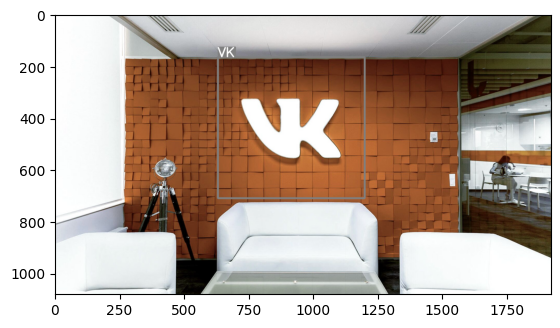

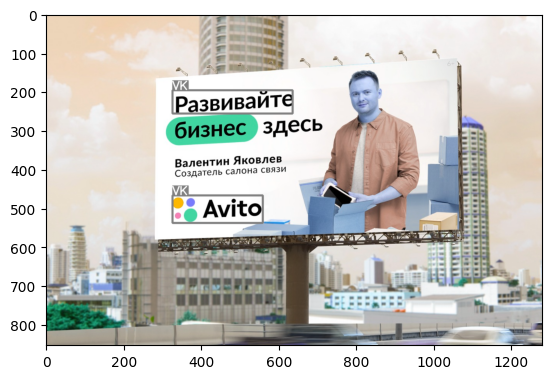

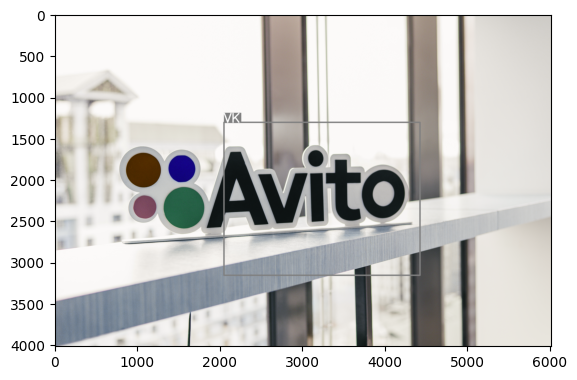

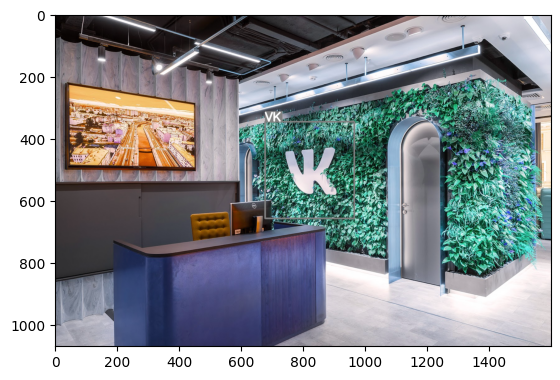

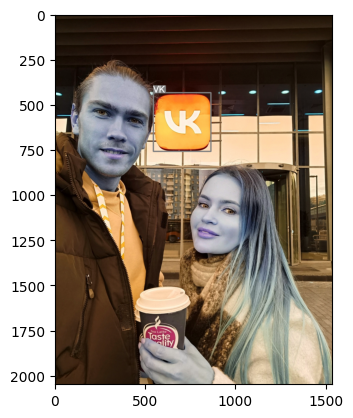

...

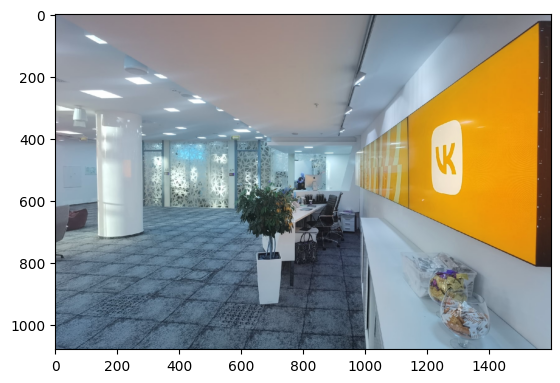

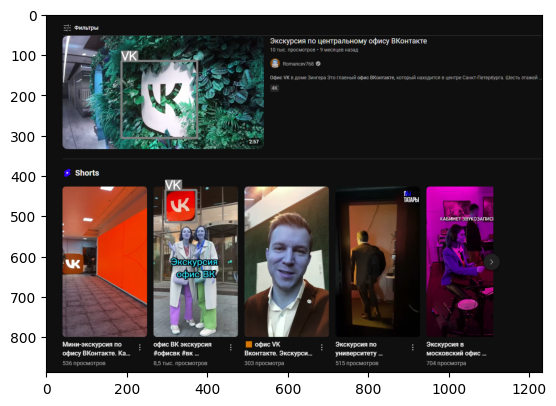

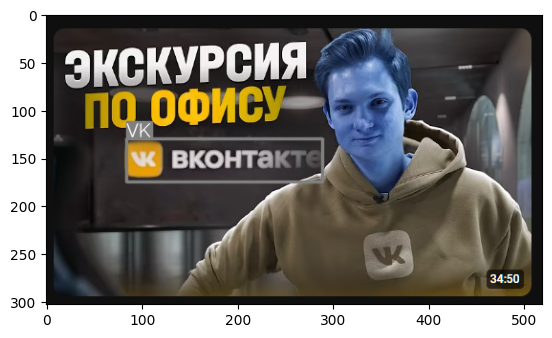

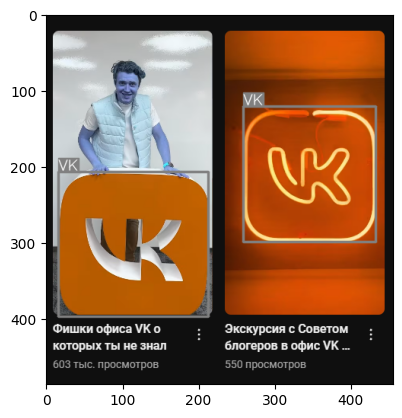

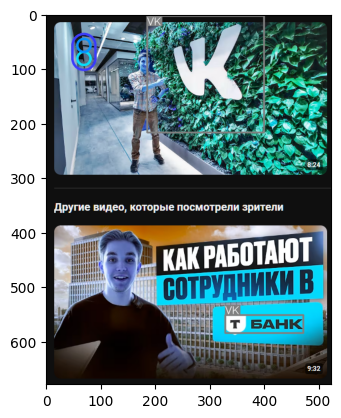

In [5]:
import matplotlib.pyplot as plt
import os

results = model([f'my_test_images/{x}' for x in os.listdir('my_test_images')])
print(len(results))
for r in results:
    img = plot_bboxes(r)
    plt.imshow(img)
    plt.show()

Местами кривовато, но, для очень простецкого создания изображений (в малом количестве) и быстрого обучения - неплохо!

### Попробуем обучить модель сразу на двух компаниях!

In [1]:
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator

model = YOLO(r'runs\detect\train37\weights\best.pt')

In [2]:
model.names

{0: 'logo', 1: 'VK'}

In [6]:
generate_additional_data(logos_path='base_logos/avito_logos', backgrounds_path='background_images', company_name='Avito', classes_in_model=len(model.names), output_folder='companies_to_find')

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:24<00:00, 40.18it/s]


In [7]:
create_yolo_structure(dataset_path='companies_to_find', output_path='yolo_dataset_vk_avito', test_size=0.15)

7650it [00:19, 392.94it/s]
1350it [00:03, 391.66it/s]


In [8]:
results = model.train(data='dataset_config_vk_avito_duo.yaml', epochs=2, batch=32)
print(results)

Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3070, 8191MiB)
engine\trainer: task=detect, mode=train, model=M:\VK_ML_tech_task\runs\detect\train37\weights\best.pt, data=dataset_config_vk_avito_duo.yaml, epochs=2, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train46, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False

train: Scanning M:\VK_ML_tech_task\yolo_dataset_vk_avito\labels\train... 7650 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7650/7650 [00:05<00:00, 1499.89it/s]


train: New cache created: M:\VK_ML_tech_task\yolo_dataset_vk_avito\labels\train.cache


val: Scanning M:\VK_ML_tech_task\yolo_dataset_vk_avito\labels\val... 1800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1800/1800 [00:01<00:00, 990.42it/s] 


val: New cache created: M:\VK_ML_tech_task\yolo_dataset_vk_avito\labels\val.cache
Plotting labels to runs\detect\train46\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train46
Starting training for 2 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/2      4.52G     0.9836      2.525      1.192          3        640: 100%|██████████| 240/240 [01:30<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:18<00:00,  1.61it/s]


                   all       1800       1800      0.923      0.826      0.934      0.809

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/2      4.57G     0.6661     0.9997     0.9933          4        640: 100%|██████████| 240/240 [01:21<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:17<00:00,  1.63it/s]


                   all       1800       1800      0.967      0.885      0.952       0.85

2 epochs completed in 0.060 hours.
Optimizer stripped from runs\detect\train46\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train46\weights\best.pt, 5.5MB

Validating runs\detect\train46\weights\best.pt...
Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3070, 8191MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:19<00:00,  1.47it/s]


                   all       1800       1800      0.965      0.885      0.952       0.85
                    VK       1024       1024      0.959      0.911      0.952      0.875
                 Avito        776        776      0.972      0.858      0.951      0.825
Speed: 0.2ms preprocess, 1.3ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs\detect\train46
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000019312627A40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019


0: 640x640 1 VK, 18.3ms
1: 640x640 1 VK, 1 Avito, 18.3ms
2: 640x640 1 Avito, 18.3ms
3: 640x640 1 VK, 18.3ms
4: 640x640 1 VK, 18.3ms
5: 640x640 1 Avito, 18.3ms
6: 640x640 1 Avito, 18.3ms
7: 640x640 1 VK, 18.3ms
8: 640x640 1 Avito, 18.3ms
9: 640x640 2 VKs, 18.3ms
10: 640x640 1 VK, 18.3ms
11: 640x640 1 VK, 18.3ms
12: 640x640 1 VK, 18.3ms
13: 640x640 2 VKs, 18.3ms
14: 640x640 2 VKs, 18.3ms
Speed: 7.7ms preprocess, 18.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
15


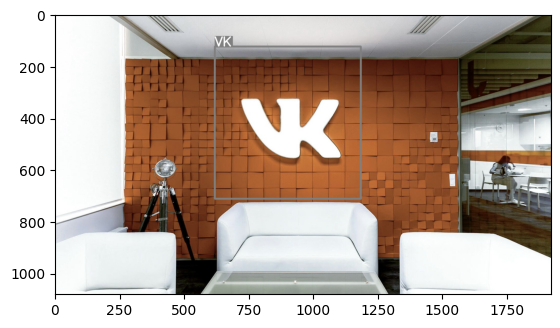

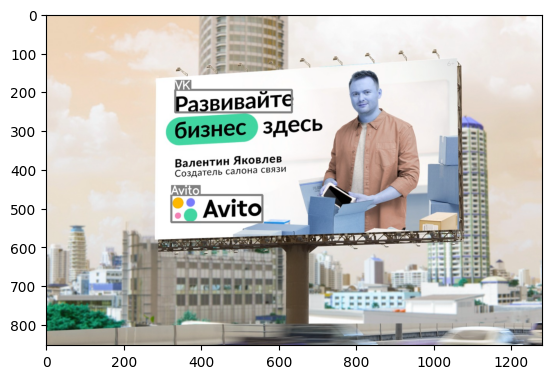

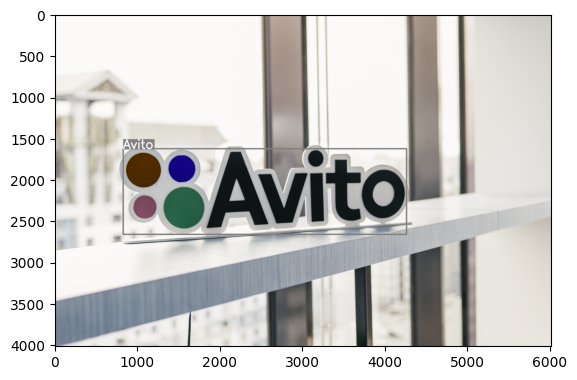

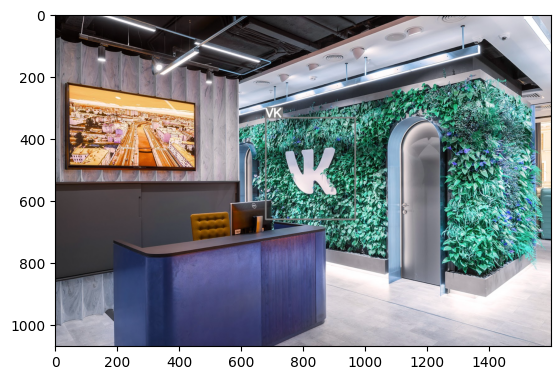

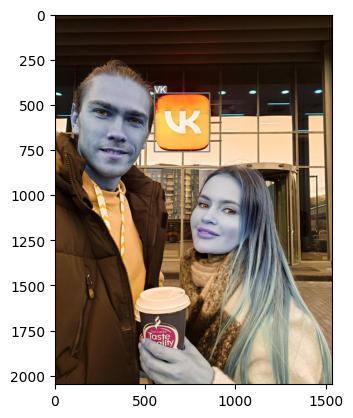

...

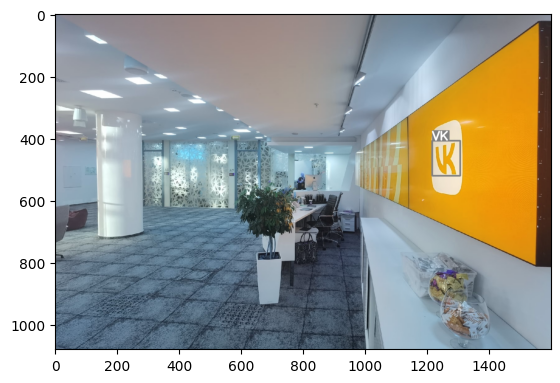

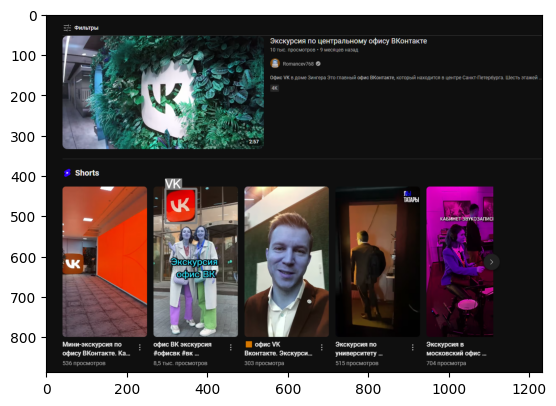

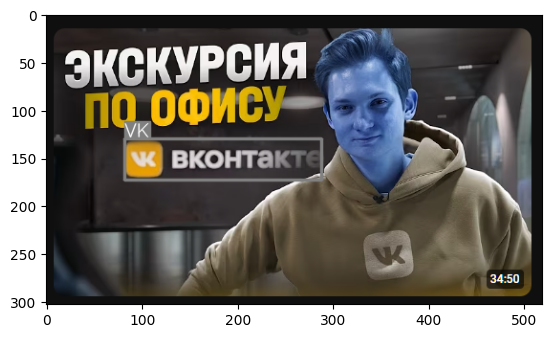

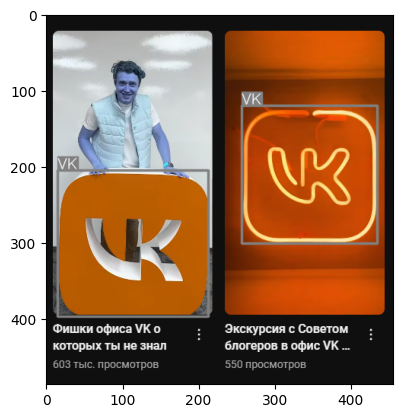

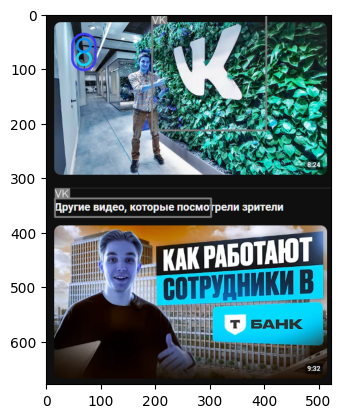

In [11]:
import matplotlib.pyplot as plt
import os

results = model([f'my_test_images/{x}' for x in os.listdir('my_test_images')])
print(len(results))
for r in results:
    img = plot_bboxes(r)
    plt.imshow(img)
    plt.show()

Очень неплохой результат, даже несмотря на то, что местами модель приняла за логотипы обычный текст.

In [12]:
export = model.export()
print(export)

Ultralytics 8.3.70  Python-3.12.3 torch-2.6.0+cu126 CPU (Intel Xeon E5-2689 0 2.60GHz)

PyTorch: starting from 'runs\detect\train46\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (5.2 MB)

TorchScript: starting export with torch 2.6.0+cu126...
TorchScript: export success  3.7s, saved as 'runs\detect\train46\weights\best.torchscript' (10.4 MB)

Export complete (4.1s)
Results saved to M:\VK_ML_tech_task\runs\detect\train46\weights
Predict:         yolo predict task=detect model=runs\detect\train46\weights\best.torchscript imgsz=640  
Validate:        yolo val task=detect model=runs\detect\train46\weights\best.torchscript imgsz=640 data=dataset_config_vk_avito_duo.yaml  
Visualize:       https://netron.app
runs\detect\train46\weights\best.torchscript


### Исходные логотипы изображений организаций

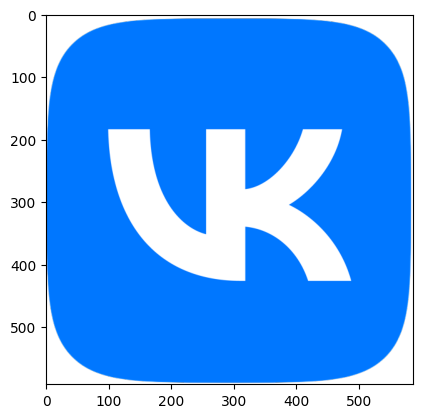

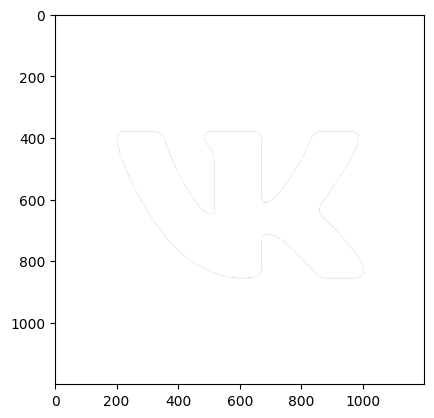

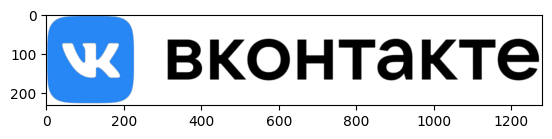

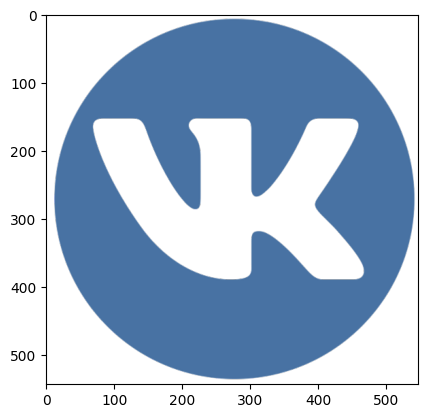

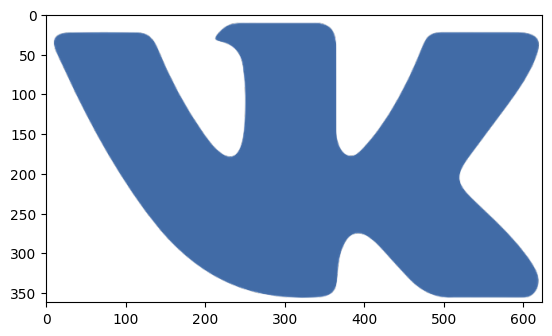

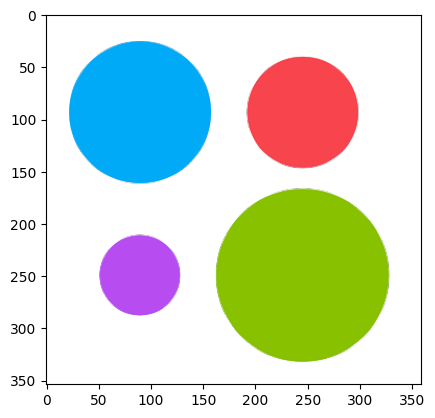

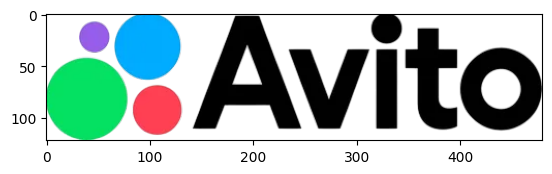

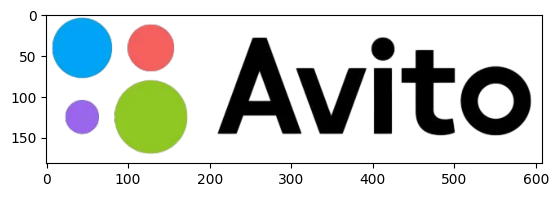

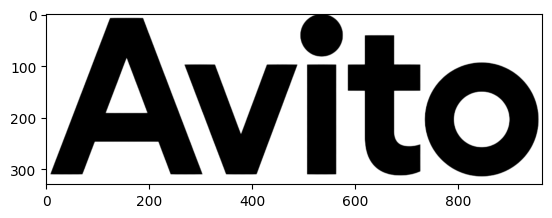

In [12]:
from PIL import Image
import matplotlib.pyplot as plt
import cv2

for el in os.listdir(r'base_logos/vk_logos'):
    img = Image.open(f'base_logos/vk_logos/{el}')
    plt.imshow(img)
    plt.show()

for el in os.listdir(r'base_logos/avito_logos'):
    img = Image.open(f'base_logos/avito_logos/{el}')
    plt.imshow(img)
    plt.show()

### Примеры изображений, на которых происходило обучение

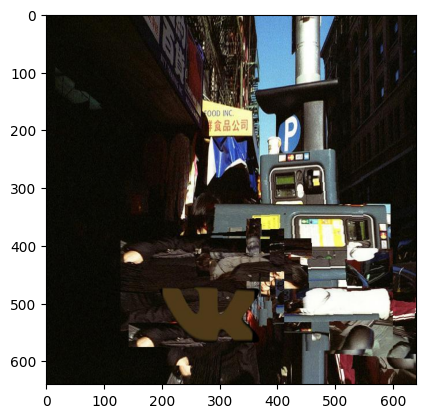

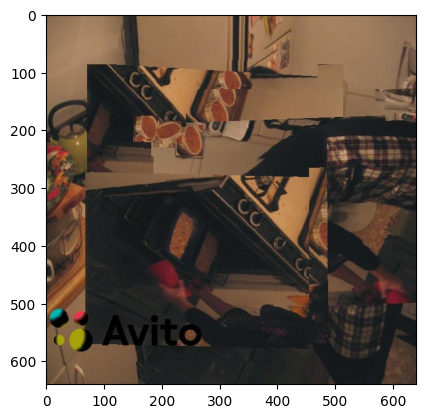

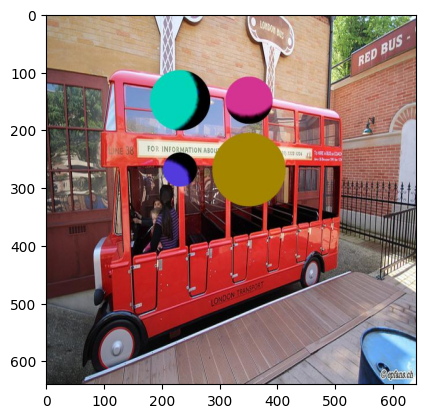

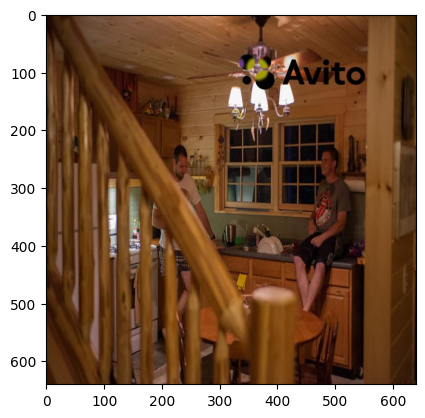

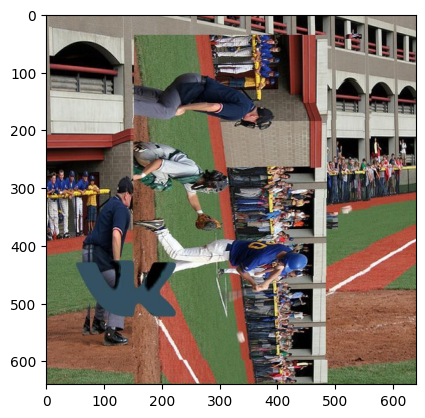

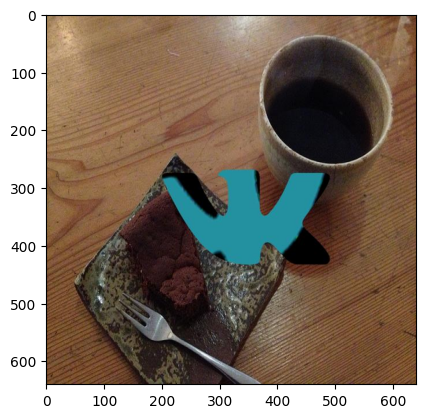

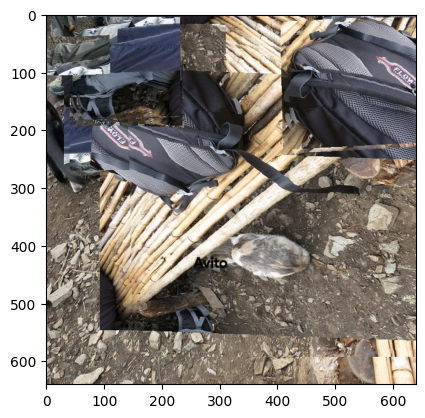

In [ ]:
for el in os.listdir(r'yolo_dataset_vk_avito/images/val')[:7]:
    img = Image.open(f'yolo_dataset_vk_avito/images/val/{el}')
    plt.imshow(img)
    plt.show()